# Brain Tumor Auto-Segmentation for Magnetic Resonance Imaging (MRI)

## Packages

In this task, we'll make use of the following packages:

- `keras` is a framework for building deep learning models.
- `keras.backend` allows us to perform math operations on tensors.
- `nibabel` will let us extract the images and labels from the files in our dataset.
- `numpy` is a library for mathematical and scientific operations.
-  `pandas` is what we'll use to manipulate our data.

In [1]:
import keras
import json
import os, sys, h5py
import numpy as np
import pandas as pd
import nibabel as nib
import matplotlib.pyplot as plt

from tensorflow.keras import backend as K 

import util

In [2]:
import numpy as np
import nibabel as nib
import itk
import itkwidgets
from ipywidgets import interact, interactive, IntSlider, ToggleButtons
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set_style('darkgrid')

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

### Extract data and dimensions of files

In [3]:
#Define the image path and load the data
image_path = "Data/Train/BRATS_001.nii.gz"
image_obj = nib.load(image_path)
print(f'Type of the image {type(image_obj)}')

Type of the image <class 'nibabel.nifti1.Nifti1Image'>


In [4]:
# Extract data as numpy ndarray
image_data = image_obj.get_fdata()
type(image_data)

numpy.ndarray

In [5]:
# Get the image shape and print it out
height, width, depth, channels = image_data.shape
print(f"The image object has the following dimensions: height: {height}, width: {width}, depth: {depth}, channels: {channels}")

The image object has the following dimensions: height: 240, width: 240, depth: 155, channels: 4


Plotting Layer 58 Channel 2 of Image


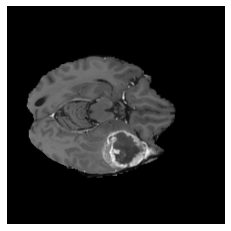

In [6]:
# Select random layer number
maxval = 154
i = np.random.randint(0, maxval)
# Define a channel to look at
channel = 2
print(f"Plotting Layer {i} Channel {channel} of Image")

plt.imshow(image_data[:, :, i, channel], cmap='gray')
plt.axis('off');

In [7]:
#Explore label
label_path = "Data/Train_labels/BRATS_001.nii.gz"
label_obj = nib.load(label_path)
print(f'Type of the image {type(label_obj)}')

Type of the image <class 'nibabel.nifti1.Nifti1Image'>


In [8]:
label_data = label_obj.get_fdata()
type(label_data)

numpy.ndarray

In [9]:
x, y, z = label_data.shape
print(f"The image object has the following dimensions: height: {x}, width: {y}, depth: {z}")

The image object has the following dimensions: height: 240, width: 240, depth: 155


<a name="1"></a>
# 1 Dataset
<a name="1-1"></a>
## 1.1 What is an MRI?

Magnetic resonance imaging (MRI) is an advanced imaging technique that is used to observe a variety of diseases and parts of the body. 

Neural networks can analyze these images individually (as a radiologist would) or combine them into a single 3D volume to make predictions.

3 different abnormalities in each image: edemas, non-enhancing tumors, and enhancing tumors.

## 1.2 MRI Data Processing

The data is from the [Decathlon 10 Challenge](https://decathlon-10.grand-challenge.org). This data has been mostly pre-processed for the competition participants, however in real practice, MRI data needs to be significantly pre-preprocessed before we can use it to train our models.

## 1.3 Exploring the Dataset

Dataset is stored in the [NifTI-1 format](https://nifti.nimh.nih.gov/nifti-1/) and we will be using the [NiBabel library](https://github.com/nipy/nibabel) to interact with the files. Each training sample is composed of two separate files:

The first file is an image file containing a 4D array of MR image in the shape of (240, 240, 155, 4). 
-  The first 3 dimensions are the X, Y, and Z values for each point in the 3D volume, which is commonly called a voxel. 
- The 4th dimension is the values for 4 different sequences
    - 0: FLAIR: "Fluid Attenuated Inversion Recovery" (FLAIR)
    - 1: T1w: "T1-weighted"
    - 2: t1gd: "T1-weighted with gadolinium contrast enhancement" (T1-Gd)
    - 3: T2w: "T2-weighted"

The second file in each training example is a label file containing a 3D array with the shape of (240, 240, 155).  
- The integer values in this array indicate the "label" for each voxel in the corresponding image files:
    - 0: background
    - 1: edema
    - 2: non-enhancing tumor
    - 3: enhancing tumor

We have access to a total of 484 training images which we will be splitting into a training (80%) and validation (20%) dataset.

We'll use the [NiBabel library](https://nipy.org/nibabel/nibabel_images.html) to load the image and label for a case.

In [10]:
# set home directory and data directory
HOME_DIR = "Data/Train"
DATA_DIR = HOME_DIR

def load_case(image_nifty_file, label_nifty_file):
    # load the image and label file, get the image content and return a numpy array for each
    image = np.array(nib.load(image_nifty_file).get_fdata())
    label = np.array(nib.load(label_nifty_file).get_fdata())
    
    return image, label

The colors correspond to each class.
- Red is edema
- Green is a non-enhancing tumor
- Blue is an enhancing tumor. 

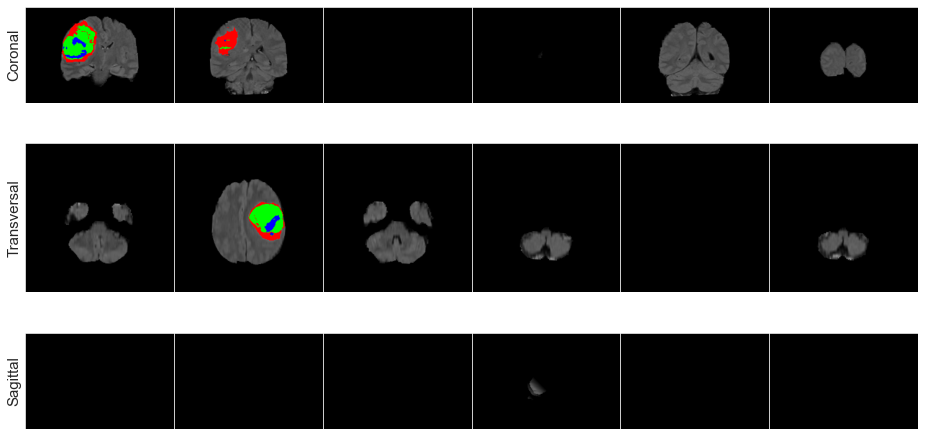

In [11]:
image, label = load_case(DATA_DIR + "/BRATS_004.nii.gz", DATA_DIR + "_labels/BRATS_004.nii.gz")
image = util.get_labeled_image(image, label)

util.plot_image_grid(image)

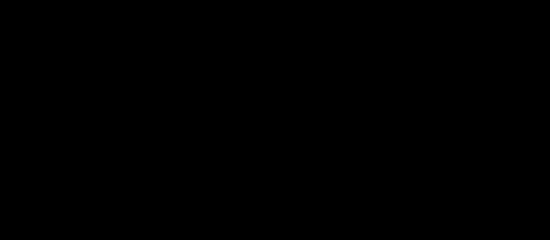

In [12]:
image, label = load_case(DATA_DIR + "/BRATS_004.nii.gz", DATA_DIR + "_labels/BRATS_004.nii.gz")
util.visualize_data_gif(util.get_labeled_image(image, label))

<a name="1-4"></a>
## 1.4 Data Preprocessing using patches

Dataset is provided in the NIfTI format, we still have to do some minor pre-processing before feeding the data to our model. 

##### Generate sub-volumes

We are going to first generate "patches" of our data which you can think of as sub-volumes of the whole MR images. 
- The reason that we are generating patches is because a network that can process the entire volume at once will simply not fit inside our current environment's memory/GPU.
- We will be using this common technique to generate spatially consistent sub-volumes of our data, which can be fed into our network. We will be generating randomly sampled sub-volumes of shape \[160, 160, 16\] from our images. 
- Given that a large portion of the MRI volumes are just brain tissue or black background without any tumors, we want to make sure that we pick patches that at least include some amount of tumor data. 
- Therefore, we are only going to pick patches that have at most 95% non-tumor regions (so at least 5% tumor). 
- We do this by filtering the volumes based on the values present in the background labels.

##### Standardization (mean 0, stdev 1)

Given that the values in MR images cover a very wide range, we will standardize the values to have a mean of zero and standard deviation of 1. 
- This is a common technique in deep image processing since standardization makes it much easier for the network to learn.

<a name="1-4-1"></a>
### 1.4.1 Sub-volume Sampling
Function below takes in:
- a 4D image (shape: \[240, 240, 155, 4\])
- its 3D label (shape: \[240, 240, 155\]) arrays, 

The function returns:
 - A randomly generated sub-volume of size \[4,160, 160, 16\]
 - Its corresponding label in a 1-hot format which has the shape \[3, 160, 160, 16\]

Additionally: 
1. Make sure that at most 95% of the returned patch is non-tumor regions. 
2. Given that our network expects the channels for our images to appear as the first dimension (instead of the last one in our current setting) reorder the dimensions of the image to have the channels appear as the first dimension.
3. Reorder the dimensions of the label array to have the first dimension as the classes (instead of the last one in our current setting)
4. Reduce the labels array dimension to only include the non-background classes (total of 3 instead of 4)

In [13]:
def get_sub_volume(image, label, 
                   orig_x = 240, orig_y = 240, orig_z = 155, 
                   output_x = 160, output_y = 160, output_z = 16,
                   num_classes = 4, max_tries = 1000, 
                   background_threshold=0.95):
    """
    Extract random sub-volume from original images.

    Args:
        image (np.array): original image, of shape (orig_x, orig_y, orig_z, num_channels)
        label (np.array): original label. 
            labels coded using discrete values rather than a separate dimension, 
            so this is of shape (orig_x, orig_y, orig_z)
        orig_x (int): x_dim of input image
        orig_y (int): y_dim of input image
        orig_z (int): z_dim of input image
        output_x (int): desired x_dim of output
        output_y (int): desired y_dim of output
        output_z (int): desired z_dim of output
        num_classes (int): number of class labels
        max_tries (int): maximum trials to do when sampling
        background_threshold (float): limit on the fraction 
            of the sample which can be the background

    returns:
        X (np.array): sample of original image of dimension 
            (num_channels, output_x, output_y, output_z)
        y (np.array): labels which correspond to X, of dimension 
            (num_classes, output_x, output_y, output_z)
    """
    # Initialize features and labels with `None`
    X = np.full((output_x, output_y, output_z, num_classes), 0)
    y = np.full((output_x, output_y, output_z), 0)
    
    tries = 0
    
    while tries < max_tries:
        # randomly sample sub-volume by sampling the corner voxel
        # hint: make sure to leave enough room for the output dimensions!
        start_x = np.random.randint(0, orig_x - output_x+1)
        #print(f'Početna lokacija x-a je: {start_x}')
        start_y = np.random.randint(0, orig_y - output_y+1)
        #print(f'Početna lokacija y-a je: {start_y}')
        start_z = np.random.randint(0, orig_z - output_z+1)
        #print(f'Početna lokacija z-a je: {start_y}.')

        # extract relevant area of label
        y = label[start_x: start_x + output_x,
                  start_y: start_y + output_y,
                  start_z: start_z + output_z]
    
        
        # One-hot encode the categories.
        # This adds a 4th dimension, 'num_classes' (output_x, output_y, output_z, num_classes)
        y = keras.utils.to_categorical(y, num_classes=num_classes)

        # compute the background ratio
        bgrd_ratio = np.sum(y[:, :, :, 0])/(output_x * output_y * output_z)
        #print(f'Background ratio je : {bgrd_ratio}\n')

        # increment tries counter
        tries += 1

        # if background ratio is below the desired threshold,use that sub-volume.
        # otherwise continue the loop and try another random sub-volume
        if bgrd_ratio < background_threshold:

            # make copy of the sub-volume
            X = np.copy(image[start_x: start_x + output_x,
                              start_y: start_y + output_y,
                              start_z: start_z + output_z, :])
    
            
            # change dimension of X from (x_dim, y_dim, z_dim, num_channels)
            # to (num_channels, x_dim, y_dim, z_dim)
            X = np.moveaxis(X, 3, 0)

            # change dimension of y from (x_dim, y_dim, z_dim, num_classes)
            # to (num_classes, x_dim, y_dim, z_dim)
            y = np.moveaxis(y, 3, 0)
            
            # take a subset of y that excludes the background class in the 'num_classes' dimension
            y = y[1:, :, :, :]
    
            return X, y  
    
    X = np.full((num_classes, output_x, output_y, output_z), 0)
    y = np.full((num_classes-1, output_x, output_y, output_z), 0)
    return X,y
    

    # if we've tried max_tries number of samples
    # Give up in order to avoid looping forever.
    print(f"Tried {tries} times to find a sub-volume. Giving up...")

Let's test it on a candidate patch and ensure that the function works correctly. We'll look at the enhancing tumor part of the label.

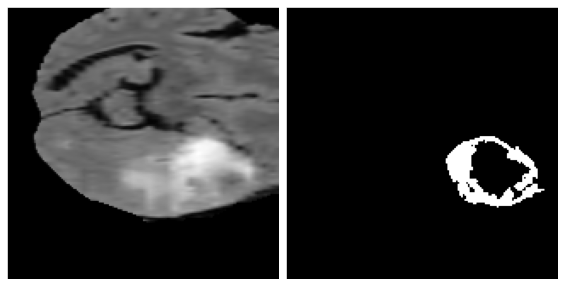

In [14]:
image, label = load_case("Data/Train/BRATS_001.nii.gz", "Data/Train_labels/BRATS_001.nii.gz")
X, y = get_sub_volume(image, label)
# enhancing tumor is channel 2 in the class label
# you can change indexer for y to look at different classes
util.visualize_patch(X[0, :, :, :], y[2])

In [15]:
print(X.shape)
print(y.shape)

(4, 160, 160, 16)
(3, 160, 160, 16)


<a name="1-4-2"></a>
### 1.4.2 Standardization

Next, fill in the following function that given a patch (sub-volume), standardizes the values across each channel and each Z plane to have a mean of zero and standard deviation of 1. 

In [16]:
def standardize(image):
    """
    Standardize mean and standard deviation of each channel and z_dimension.

    Args:
        image (np.array): input image, shape (num_channels, dim_x, dim_y, dim_z)

    Returns:
        standardized_image (np.array): standardized version of input image
    """
    
    # initialize to array of zeros, with same shape as the image
    standardized_image = np.zeros(image.shape)

    # iterate over channels
    for c in range(image.shape[0]):
        # iterate over the `z` dimension
        for z in range(image.shape[3]):
            # get a slice of the image 
            # at channel c and z-th dimension `z`
            image_slice = image[c,:,:,z]

            # subtract the mean
            centered = image_slice - np.mean(image_slice)

            # divide by the standard deviation
            if np.std(centered) != 0:
                centered_scaled = centered / np.std(centered)

            # update  the slice of standardized image
            # with the scaled centered and scaled image
                standardized_image[c, :, :, z] = centered_scaled

    return standardized_image

In [17]:
X_norm = standardize(X)
print("standard deviation for a slice should be 1.0")
print(f"stddv for X_norm[0, :, :, 0]: {X_norm[0,:,:,0].std():.2f}")

standard deviation for a slice should be 1.0
stddv for X_norm[0, :, :, 0]: 1.00


<a name="2"></a>
# 2 Model

<a name="2-1"></a>
## 2.1 The 3D U-Net
Now let's build our model. In this assignment we will be building a [3D U-net](https://arxiv.org/abs/1606.06650). 
- This architecture will take advantage of the volumetric shape of MR images and is one of the best performing models for this task. 
- Feel free to familiarize yourself with the architecture by reading [this paper](https://arxiv.org/abs/1606.06650).

<img src="https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/u-net-architecture.png" width="50%">

<a name="3"></a>
# 3 Metrics

<a name="3-1"></a>
## 3.1 Dice Similarity Coefficient

A natural choice that you may be familiar with is the cross-entropy loss function. However, this loss function is not ideal for segmentation tasks due to heavy class imbalance (there are typically not many positive regions). 

A much more common loss for segmentation tasks is the Dice similarity coefficient, which is a measure of how well two contours overlap. 
The Dice index ranges from 0 (complete mismatch) to 1 (perfect match).

In general, for two sets $A$ and $B$, the Dice similarity coefficient is defined as: 
$$\text{DSC}(A, B) = \frac{2 \times |A \cap B|}{|A| + |B|}.$$

Here we can interpret $A$ and $B$ as sets of voxels, $A$ being the predicted tumor region and $B$ being the ground truth. 

Our model will map each voxel to 0 or 1
- 0 means it is a background voxel
- 1 means it is part of the segmented region

In the dice coefficient, the variables in the formula are:
- $x$ : the input image
- $f(x)$ : the model output (prediction)
- $y$ : the label (actual ground truth)

The dice coefficient "DSC" is:

$$\text{DSC}(f, x, y) = \frac{\sum_{i, j} f(x)_{ij} \times y_{ij} + \epsilon}{\sum_{i,j} f(x)_{ij} + \sum_{i, j} y_{ij} + \epsilon}$$

- $\epsilon$ is a small number that is added to avoid division by zero

<img src="https://www.researchgate.net/publication/328671987/figure/fig4/AS:688210103529478@1541093483784/Calculation-of-the-Dice-similarity-coefficient-The-deformed-contour-of-the-liver-from.ppm" width="30%">

[Image Source](https://www.researchgate.net/figure/Calculation-of-the-Dice-similarity-coefficient-The-deformed-contour-of-the-liver-from_fig4_328671987)

Implement the dice coefficient for a single output class below.

In [18]:
def single_class_dice_coefficient(y_true, y_pred, axis=(0, 1, 2), epsilon=0.00001):
    """
    Compute dice coefficient for single class.

    Args:
        y_true (Tensorflow tensor): tensor of ground truth values for single class.
                                    shape: (x_dim, y_dim, z_dim)
        y_pred (Tensorflow tensor): tensor of predictions for single class.
                                    shape: (x_dim, y_dim, z_dim)
        axis (tuple): spatial axes to sum over when computing numerator and
                      denominator of dice coefficient.
                      Hint: pass this as the 'axis' argument to the K.sum function.
        epsilon (float): small constant added to numerator and denominator to
                        avoid divide by 0 errors.
    Returns:
        dice_coefficient (float): computed value of dice coefficient.     
    """

    
    dice_numerator = 2. * K.sum(y_true * y_pred, axis=axis) + epsilon
    dice_denominator = K.sum(y_true, axis=axis) + K.sum(y_pred, axis=axis) + epsilon
    dice_coefficient = (dice_numerator) / (dice_denominator)
    

    return dice_coefficient

Now that we have the single class case, we can think about how to approach the multi class context. 
- We want segmentations for each of the 3 classes of abnormality (edema, enhancing tumor, non-enhancing tumor). 
- This will give us 3 different dice coefficients (one for each abnormality class). 
- To combine these, we can just take the average. We can write that the overall dice coefficient is: 

$$DC(f, x, y) = \frac{1}{3} \left ( DC_{1}(f, x, y) + DC_{2}(f, x, y) + DC_{3}(f, x, y) \right )$$

- $DC_{1}$, $DC_{2}$ and $DC_{3}$ are edema, enhancing tumor, and non-enhancing tumor dice coefficients.

Implement the mean dice coefficient below. This should not be very different from your singe-class implementation.

In [19]:
def dice_coefficient(y_true, y_pred, axis=(1, 2, 3), 
                     epsilon=0.00001):
    """
    Compute mean dice coefficient over all abnormality classes.

    Args:
        y_true (Tensorflow tensor): tensor of ground truth values for all classes.
                                    shape: (num_classes, x_dim, y_dim, z_dim)
        y_pred (Tensorflow tensor): tensor of predictions for all classes.
                                    shape: (num_classes, x_dim, y_dim, z_dim)
        axis (tuple): spatial axes to sum over when computing numerator and
                      denominator of dice coefficient.
                      Hint: pass this as the 'axis' argument to the K.sum
                            and K.mean functions.
        epsilon (float): small constant add to numerator and denominator to
                        avoid divide by 0 errors.
    Returns:
        dice_coefficient (float): computed value of dice coefficient.     
    """

    ### START CODE HERE (REPLACE INSTANCES OF 'None' with your code) ###
    
    dice_numerator = 2. * K.sum(y_true * y_pred, axis=axis) + epsilon
    dice_denominator = K.sum(y_true, axis=axis) + K.sum(y_pred, axis=axis) + epsilon
    dice_coefficient = K.mean((dice_numerator)/(dice_denominator))
    
    ### END CODE HERE ###

    return dice_coefficient

<a name="3-2"></a>
## 3.2 Soft Dice Loss

While the Dice Coefficient makes intuitive sense, it is not the best for training. 
- It takes in discrete values (zeros and ones). 
- The model outputs *probabilities* that each pixel is, say, a tumor or not, and we want to be able to backpropagate through those outputs. 

Therefore, we need an analogue of the Dice loss which takes real valued input. This is where the soft Dice loss comes in. The formula is: 

$$\mathcal{L}_{Dice}(p, q) = 1 - \frac{2\times\sum_{i, j} p_{ij}q_{ij} + \epsilon}{\left(\sum_{i, j} p_{ij}^2 \right) + \left(\sum_{i, j} q_{ij}^2 \right) + \epsilon}.$$

- $p$ is our predictions
- $q$ is the ground truth 
- In practice each $q_i$ will either be 0 or 1. 
- $\epsilon$ is a small number that is added to avoid division by zero

The soft Dice loss ranges between 0: perfectly matching the ground truth distribution $q$ and 1: complete mismatch with the ground truth.

You can also check that if $p_i$ and $q_i$ are each 0 or 1, then the soft Dice loss is just one minus the dice coefficient.

In [20]:
def soft_dice_loss(y_true, y_pred, axis=(1, 2, 3), 
                   epsilon=0.00001):
    """
    Compute mean soft dice loss over all abnormality classes.

    Args:
        y_true (Tensorflow tensor): tensor of ground truth values for all classes.
                                    shape: (num_classes, x_dim, y_dim, z_dim)
        y_pred (Tensorflow tensor): tensor of soft predictions for all classes.
                                    shape: (num_classes, x_dim, y_dim, z_dim)
        axis (tuple): spatial axes to sum over when computing numerator and
                      denominator in formula for dice loss.
                      Hint: pass this as the 'axis' argument to the K.sum
                            and K.mean functions.
        epsilon (float): small constant added to numerator and denominator to
                        avoid divide by 0 errors.
    Returns:
        dice_loss (float): computed value of dice loss.     
    """

    dice_numerator = 2. * K.sum(y_true * y_pred, axis=axis) + epsilon
    dice_denominator = K.sum(y_true**2, axis=axis) + K.sum(y_pred**2, axis=axis) + epsilon
    dice_loss = 1 - K.mean((dice_numerator)/(dice_denominator))


    return dice_loss

# 4 Create and Train the model

In [21]:
unet_model = util.unet_model_3d(loss_function=soft_dice_loss, metrics=[dice_coefficient])

In [22]:
unet_model.summary() 

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 4, 160, 160, 0                                            
__________________________________________________________________________________________________
conv3d (Conv3D)                 (None, 32, 160, 160, 3488        input_1[0][0]                    
__________________________________________________________________________________________________
activation (Activation)         (None, 32, 160, 160, 0           conv3d[0][0]                     
__________________________________________________________________________________________________
conv3d_1 (Conv3D)               (None, 64, 160, 160, 55360       activation[0][0]                 
______________________________________________________________________________________________

In [9]:
import pydot
from keras.utils.vis_utils import plot_model

In [10]:
plot_model(unet_model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

('Failed to import pydot. You must `pip install pydot` and install graphviz (https://graphviz.gitlab.io/download/), ', 'for `pydotprint` to work.')


<a name="4-1"></a>
## 4.1 Training on a Large Dataset

In order to facilitate the training on the large dataset:
- We have pre-processed the entire dataset into patches and stored the patches in the [`h5py`](http://docs.h5py.org/en/stable/) format. 
- We also wrote a custom Keras [`Sequence`](https://www.tensorflow.org/api_docs/python/tf/keras/utils/Sequence) class which can be used as a `Generator` for the keras model to train on large datasets. 
- Feel free to look at the `VolumeDataGenerator` class in `util.py` to learn about how such a generator can be coded.
 

### 4.1.1 Pre-process the entire dataset into patches

### The h5py package is a Pythonic interface to the HDF5 binary data format.

HDF5 lets you store huge amounts of numerical data, and easily manipulate that data from NumPy. 
For example, you can slice into multi-terabyte datasets stored on disk, as if they were real NumPy arrays. 
Thousands of datasets can be stored in a single file, categorized and tagged however you want.

### HDF5 File Structure

- similar to the file system directory tree (can have nodes and branches)
- top level of the HDF5 tree is a file
- file may contain groups and datasets
- each group may contain other groups and datasets
- each dataset contains the data objects, which in most cases can be associated with NumPy types

3 basic types of items in HDF5 file:
- file, group and dataset
- their names are used as access keys

### Checking if GPU is on for training:

In [14]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 697787239759787333
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 4949437312
locality {
  bus_id: 1
  links {
  }
}
incarnation: 17105393718692486964
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 2060, pci bus id: 0000:01:00.0, compute capability: 7.5"
]


### Validate dataset: Tako 20% of original dataset (~97) and generate 30 x 97 = 2910 patches ~ 50 GB

In [39]:
image_path = "Data/Valid/"
label_path = "Data/Valid_labels/"
dirs = os.listdir(image_path)

for file in dirs:
    image, label = load_case(image_path + file, label_path + file) 
    print(f'Datoteka {image_path+file} je učitana.\n')
    for i in range(30): #ovdje će ići broj patcheva koje želim generirati po slici, koliko memorija dopusti
        patch, labels = get_sub_volume(image, label) #dobivanje sub-volume-a
        patch_x = standardize(patch)
         
        if patch.any()!=None:                 
            with h5py.File("BraTS-Data/processed/valid_standardize/" + file + str(i) + ".h5", "w") as data_file:
                data_file.create_dataset("X", (4, 160, 160, 16), data = patch_x) 
                data_file.create_dataset("y", (3, 160, 160, 16), data = labels)

Datoteka Data/Valid/BRATS_388.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_389.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Valid/BRATS_390.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Valid/BRATS_391.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_392.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_393.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_394.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_395.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_396.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_397.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_398.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_399.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_400.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_401.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_402.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_403.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_404.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_405.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_406.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Valid/BRATS_407.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_408.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_409.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_410.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_411.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_412.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_413.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Valid/BRATS_414.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_415.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_416.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_417.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_418.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_419.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_420.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_421.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_422.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_423.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_424.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_425.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_426.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_427.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_428.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_429.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_430.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_431.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_432.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_433.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_434.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_435.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_436.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_437.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_438.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Valid/BRATS_439.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_440.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_441.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_442.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_443.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Valid/BRATS_444.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_445.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_446.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_447.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_448.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_449.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_450.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_451.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_452.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_453.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_454.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_455.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_456.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_457.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_458.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_459.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Valid/BRATS_460.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_461.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_462.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_463.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_464.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_465.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_466.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Valid/BRATS_467.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_468.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_469.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_470.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_471.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_472.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_473.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Valid/BRATS_474.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_475.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_476.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_477.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_478.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_479.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_480.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_481.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_482.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_483.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Valid/BRATS_484.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

### Train dataset: take 80% of the original dataset (~387) and generate 30 x 387 = 11610 patches ~ 197 GB

In [37]:
import os, sys, h5py
image_path = "Data/Train/"
label_path = "Data/Train_labels/"
dirs = os.listdir(image_path)


for file in dirs:
    image, label = load_case(image_path + file, label_path + file) 
    print(f'Datoteka {image_path+file} je učitana.\n')
    for i in range(30): #ovdje će ići broj patcheva koje želim generirati po slici, koliko memorija dopusti
        patch, labels = get_sub_volume(image, label) #dobivanje sub-volume-a
        patch_x = standardize(patch)
        
        if patch.any()!=None:            
            with h5py.File("BraTS-Data/processed/train_standardize/" + file + str(i) + ".h5", "w") as data_file:
                data_file.create_dataset("X", (4, 160, 160, 16), data = patch_x) 
                data_file.create_dataset("y", (3, 160, 160, 16), data = labels)

Datoteka Data/Train/BRATS_001.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_002.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_003.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_004.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_005.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_006.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_007.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_008.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_009.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_010.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_011.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_012.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_013.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_014.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_015.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_016.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_017.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_018.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_019.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_020.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_021.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_022.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_023.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_024.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_025.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_026.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_027.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_028.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_029.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_030.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_031.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_032.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_033.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_034.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_035.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_036.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_037.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_038.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_039.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_040.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_041.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_042.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_043.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_044.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_045.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_046.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_047.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_048.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_049.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_050.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_051.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_052.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_053.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_054.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_055.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_056.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_057.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_058.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_059.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_060.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_061.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_062.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_063.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_064.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_065.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_066.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_067.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_068.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_069.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_070.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_071.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_072.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_073.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_074.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_075.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_076.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_077.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_078.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_079.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_080.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_081.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_082.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_083.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_084.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_085.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_086.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_087.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_088.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_089.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_090.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_091.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_092.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_093.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_094.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_095.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_096.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_097.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_098.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_099.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_100.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_101.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_102.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_103.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_104.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_105.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_106.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_107.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_108.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_109.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_110.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_111.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_112.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_113.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_114.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_115.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_116.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_117.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_118.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_119.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_120.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_121.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_122.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_123.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_124.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_125.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_126.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_127.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_128.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_129.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_130.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_131.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_132.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_133.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_134.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_135.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_136.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_137.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_138.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_139.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_140.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_141.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_142.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_143.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_144.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_145.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_146.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_147.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_148.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_149.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_150.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_151.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_152.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_153.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_154.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_155.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_156.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_157.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_158.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_159.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_160.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_161.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_162.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_163.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_164.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_165.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_166.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_167.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_168.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_169.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_170.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_171.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_172.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_173.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_174.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_175.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_176.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_177.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_178.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_179.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_180.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_181.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_182.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_183.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_184.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_185.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_186.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_187.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_188.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_189.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_190.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_191.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_192.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_193.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_194.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_195.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_196.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_197.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_198.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_199.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_200.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_201.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_202.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_203.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_204.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_205.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_206.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_207.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_208.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_209.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_210.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_211.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_212.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_213.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_214.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_215.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_216.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_217.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_218.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_219.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_220.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_221.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_222.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_223.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_224.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_225.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_226.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_227.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_228.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_229.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_230.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_231.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_232.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_233.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_234.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_235.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_236.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_237.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_238.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_239.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_240.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_241.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_242.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_243.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_244.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_245.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_246.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_247.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_248.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_249.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_250.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_251.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_252.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_253.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_254.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_255.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_256.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_257.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_258.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_259.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_260.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_261.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_262.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_263.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_264.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_265.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_266.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_267.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_268.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_269.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_270.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_271.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_272.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_273.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_274.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_275.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_276.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_277.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_278.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_279.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_280.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_281.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_282.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_283.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_284.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_285.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_286.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_287.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_288.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_289.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_290.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_291.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_292.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_293.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_294.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_295.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_296.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_297.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_298.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_299.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_300.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_301.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_302.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_303.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_304.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_305.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_306.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_307.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_308.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_309.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_310.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_311.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_312.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_313.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_314.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_315.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_316.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_317.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_318.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_319.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_320.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_321.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_322.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_323.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_324.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_325.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_326.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_327.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_328.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_329.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_330.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_331.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_332.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_333.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_334.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_335.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_336.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_337.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_338.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_339.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_340.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_341.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_342.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_343.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_344.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_345.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_346.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_347.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_348.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_349.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_350.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_351.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_352.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_353.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_354.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_355.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_356.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_357.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_358.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_359.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_360.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_361.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_362.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_363.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_364.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_365.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_366.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_367.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_368.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_369.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_370.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_371.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_372.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_373.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_374.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_375.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_376.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_377.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_378.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_379.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_380.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_381.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_382.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<i4">

Datoteka Data/Train/BRATS_383.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_384.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_385.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_386.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

Datoteka Data/Train/BRATS_387.nii.gz je učitana.



<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

<HDF5 dataset "X": shape (4, 160, 160, 16), type "<f8">

<HDF5 dataset "y": shape (3, 160, 160, 16), type "<f4">

### Checking if I can access X and y by the .get method as well as the shapes of the outputs

In [94]:
hf = h5py.File('BraTS-Data/processed/train_standardize/BRATS_303.nii.gz12.h5', 'r')

In [95]:
n1 = np.array(hf.get("X"))
n1.shape

(4, 160, 160, 16)

In [96]:
n2 = np.array(hf.get("y"))
n2.shape

(3, 160, 160, 16)

### Checking how generated patches look

In [115]:
patch = np.array(hf.get("X"))
labels = np.array(hf.get("y"))

In [118]:
#0 znači nije, 1 znači je
np.unique(labels)

array([0., 1.], dtype=float32)

In [119]:
np.unique(labels[0])

array([0., 1.], dtype=float32)

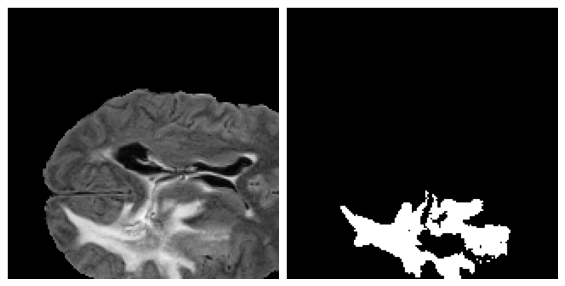

In [14]:
#0: edema
util.visualize_patch(patch[0, :, :, :], labels[0])

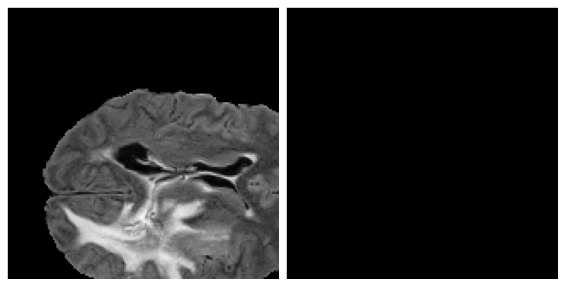

In [15]:
#non-enhancing tumor
util.visualize_patch(patch[0, :, :, :], labels[1])

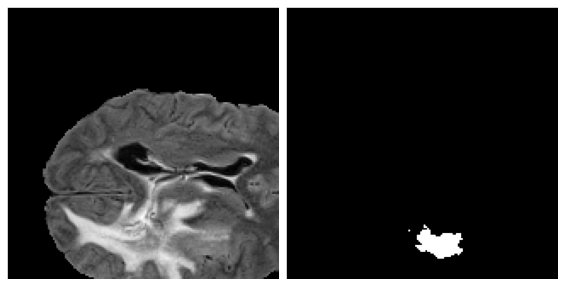

In [16]:
#enhancing tumor
util.visualize_patch(patch[0, :, :, :], labels[2])

### Make a json file with the names of all train and validate files

In [40]:
import json
dictionary ={
    "valid" : list(os.listdir("BraTS-Data/processed/valid_standardize")),
    "train" : list(os.listdir("BraTS-Data/processed/train_standardize"))
}
  
# Serializing json 
json_object = json.dumps(dictionary, indent = 4)
  
# Writing to sample.json
with open("config.json", "w") as outfile:
    outfile.write(json_object)

474364

In [23]:
base_dir = "BraTS-Data/processed/"

with open(base_dir + "config.json") as json_file:
    config = json.load(json_file)
    
#The batch size is a hyperparameter that defines the number of samples to work through before updating the internal 
#model parameters.
#Think of a batch as a for-loop iterating over one or more samples and making predictions. 
#At the end of the batch, the predictions are compared to the expected output variables and an error is calculated. 
#From this error, the update algorithm is used to improve the model, e.g. move down along the error gradient.

# Get generators for training and validation sets
train_generator = util.VolumeDataGenerator(config["train"], base_dir + "train_standardize/", batch_size=1, dim=(160, 160, 16), verbose=0)
valid_generator = util.VolumeDataGenerator(config["valid"], base_dir + "valid_standardize/", batch_size=1, dim=(160, 160, 16), verbose=0)

## Train

In [ ]:
#steps_per_epoch = 10

#Data on which to evaluate the loss and any model metrics at the end of each epoch. The model will not be trained on this data.

#The number of epochs is a hyperparameter that defines the number of times that the learning algorithm will work through 
#the entire training dataset. You can think of a for-loop over the number of epochs where each loop proceeds over the 
#training dataset. Within this for-loop is another nested for-loop that iterates over each batch of samples, 
#where one batch has the specified “batch size” number of samples.

n_epochs= 10

#lr = 0.001
#validation_steps = 10

unet_history = unet_model.fit(x=train_generator,
        #steps_per_epoch=steps_per_epoch,
        epochs=n_epochs,
        verbose = 1,
        #use_multiprocessing=True,
        validation_data=valid_generator)
        #validation_steps=validation_steps)

Epoch 1/10
11610/11610 [==============================] - 13442s 1s/step - loss: 0.3341 - dice_coefficient: 0.5709 - val_loss: 0.1499 - val_dice_coefficient: 0.7613
Epoch 2/10
11610/11610 [==============================] - 13314s 1s/step - loss: 0.1433 - dice_coefficient: 0.7771 - val_loss: 0.1394 - val_dice_coefficient: 0.7752
Epoch 3/10
11610/11610 [==============================] - 13161s 1s/step - loss: 0.1198 - dice_coefficient: 0.8092 - val_loss: 0.1398 - val_dice_coefficient: 0.7915
Epoch 4/10
11610/11610 [==============================] - 13036s 1s/step - loss: 0.1032 - dice_coefficient: 0.8322 - val_loss: 0.1368 - val_dice_coefficient: 0.7998
Epoch 5/10
11610/11610 [==============================] - 13013s 1s/step - loss: 0.0913 - dice_coefficient: 0.8494 - val_loss: 0.1405 - val_dice_coefficient: 0.7910
Epoch 6/10
11610/11610 [==============================] - 13033s 1s/step - loss: 0.0831 - dice_coefficient: 0.8607 - val_loss: 0.1388 - val_dice_coefficient: 0.8060
Epoch 7/10

In [ ]:
model_json = model_lr_005.to_json()
with open("model_lr_005.json", "w") as json_file:
    json_file.write(model_json)

model_lr_005.save_weights("weights_model_lr_005.h5")
print("Saved model to disk")

In [75]:
print(model_history.history.keys())

dict_keys(['loss', 'dice_coefficient', 'val_loss', 'val_dice_coefficient'])


In [25]:
layer_dict = dict([(layer.name, layer) for layer in unet_history.layers])

layer_name = 'conv3d_8'
filter_index = 0 # Which filter in this block would you like to visualise?

# Grab the filters and biases for that layer
filters, biases = layer_dict[layer_name].get_weights()

# Normalize filter values to a range of 0 to 1 so we can visualize them
f_min, f_max = np.amin(filters), np.amax(filters)
filters = (filters - f_min) / (f_max - f_min)

# Plot first few filters
n_filters, index = 6, 1
for i in range(n_filters):
    f = filters[:, :, :, i]
    
    # Plot each channel separately
    for j in range(3):

        ax = plt.subplot(n_filters, 3, index)
        ax.set_xticks([])
        ax.set_yticks([])
        
        plt.imshow(f[:, :, j], cmap='viridis')
        index += 1
        
plt.show()

NameError: name 'unet_history' is not defined

# Model with learning rate 0.01

In [130]:
model_2 = util.unet_model_3d(loss_function=soft_dice_loss, metrics=[dice_coefficient])

In [133]:
#steps_per_epoch = 10

#Data on which to evaluate the loss and any model metrics at the end of each epoch. The model will not be trained on this data.

#The number of epochs is a hyperparameter that defines the number of times that the learning algorithm will work through 
#the entire training dataset. You can think of a for-loop over the number of epochs where each loop proceeds over the 
#training dataset. Within this for-loop is another nested for-loop that iterates over each batch of samples, 
#where one batch has the specified “batch size” number of samples.

n_epochs= 10

#validation_steps = 10

model_history = model_2.fit(x=train_generator,
        #steps_per_epoch=steps_per_epoch,
        epochs=n_epochs,
        verbose = 1,
        #use_multiprocessing=True,
        validation_data=valid_generator)
        #validation_steps=validation_steps)

Epoch 1/10
11610/11610 [==============================] - 13268s 1s/step - loss: 0.4514 - dice_coefficient: 0.4408 - val_loss: 0.2549 - val_dice_coefficient: 0.6540
Epoch 2/10
11610/11610 [==============================] - 13195s 1s/step - loss: 0.2859 - dice_coefficient: 0.6216 - val_loss: 0.1440 - val_dice_coefficient: 0.7573
Epoch 3/10
11610/11610 [==============================] - 13125s 1s/step - loss: 0.1243 - dice_coefficient: 0.7785 - val_loss: 0.1396 - val_dice_coefficient: 0.7673
Epoch 4/10
11610/11610 [==============================] - 13056s 1s/step - loss: 0.1090 - dice_coefficient: 0.8017 - val_loss: 0.1415 - val_dice_coefficient: 0.7831
Epoch 5/10
11610/11610 [==============================] - 13101s 1s/step - loss: 0.0964 - dice_coefficient: 0.8235 - val_loss: 0.1408 - val_dice_coefficient: 0.7910
Epoch 6/10
11610/11610 [==============================] - 13339s 1s/step - loss: 0.0896 - dice_coefficient: 0.8357 - val_loss: 0.1405 - val_dice_coefficient: 0.7977
Epoch 7/10

### Model with learning rate 0.1

In [154]:
model_3 = util.unet_model_3d(loss_function=soft_dice_loss, metrics=[dice_coefficient])

In [155]:
#steps_per_epoch = 10

#Data on which to evaluate the loss and any model metrics at the end of each epoch. The model will not be trained on this data.

#The number of epochs is a hyperparameter that defines the number of times that the learning algorithm will work through 
#the entire training dataset. You can think of a for-loop over the number of epochs where each loop proceeds over the 
#training dataset. Within this for-loop is another nested for-loop that iterates over each batch of samples, 
#where one batch has the specified “batch size” number of samples.

n_epochs= 10

#validation_steps = 10

model_history = model_3.fit(x=train_generator,
        #steps_per_epoch=steps_per_epoch,
        epochs=n_epochs,
        verbose = 1,
        #use_multiprocessing=True,
        validation_data=valid_generator)
        #validation_steps=validation_steps)

Epoch 1/10
11610/11610 [==============================] - 13084s 1s/step - loss: 0.4535 - dice_coefficient: 0.4369 - val_loss: 0.2435 - val_dice_coefficient: 0.6592
Epoch 2/10
11610/11610 [==============================] - 13128s 1s/step - loss: 0.2888 - dice_coefficient: 0.6177 - val_loss: 0.1460 - val_dice_coefficient: 0.7586
Epoch 3/10
11610/11610 [==============================] - 13234s 1s/step - loss: 0.1246 - dice_coefficient: 0.7780 - val_loss: 0.1408 - val_dice_coefficient: 0.7715
Epoch 4/10
11610/11610 [==============================] - 13159s 1s/step - loss: 0.1094 - dice_coefficient: 0.7998 - val_loss: 0.1454 - val_dice_coefficient: 0.7681
Epoch 5/10
11610/11610 [==============================] - 13030s 1s/step - loss: 0.0985 - dice_coefficient: 0.8171 - val_loss: 0.1410 - val_dice_coefficient: 0.7876
Epoch 6/10
11610/11610 [==============================] - 13178s 1s/step - loss: 0.0909 - dice_coefficient: 0.8286 - val_loss: 0.1401 - val_dice_coefficient: 0.7928
Epoch 7/10

In [ ]:
model_json = model_lr_005.to_json()
with open("model_lr_005.json", "w") as json_file:
    json_file.write(model_json)

model_lr_005.save_weights("weights_model_lr_005.h5")
print("Saved model to disk")

### History - Model 1

### First pass results

### Second pass results

### History - Model 2

### First pass results

### History - lr 0.1

### Model 2 graphs 

Text(0.5, 1.0, 'Dice coefficient')

Text(0, 0.5, 'dice coefficient')

Text(0.5, 0, 'epoch')

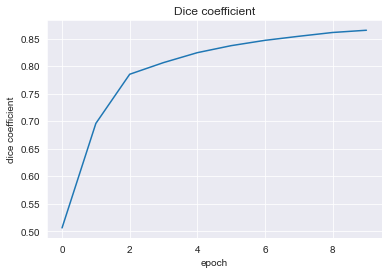

In [137]:
#Dice coefficient during training
plt.plot(model_history.history['dice_coefficient'])
plt.title('Dice coefficient')
plt.ylabel('dice coefficient')
plt.xlabel('epoch')
#plt.legend(['train', 'test'], loc='upper left')
plt.show()

Text(0.5, 1.0, 'Loss')

Text(0, 0.5, 'loss')

Text(0.5, 0, 'epoch')

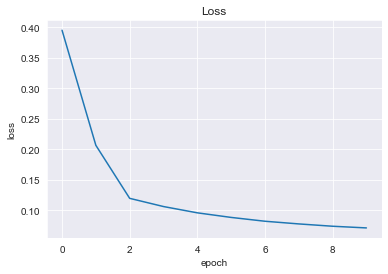

In [138]:
plt.plot(model_history.history['loss'])
plt.title('Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

### Andrijin model

Text(0.5, 1.0, 'Dice coefficient')

Text(0, 0.5, 'dice coefficient')

Text(0.5, 0, 'epoch')

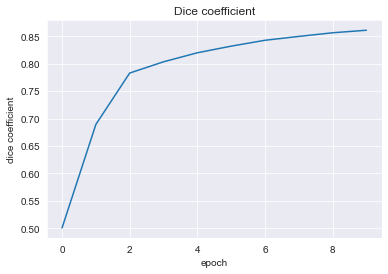

In [163]:
#Dice coefficient during training
plt.plot(model_history.history['dice_coefficient'])
plt.title('Dice coefficient')
plt.ylabel('dice coefficient')
plt.xlabel('epoch')
#plt.legend(['train', 'test'], loc='upper left')
plt.show()

Text(0.5, 1.0, 'Loss')

Text(0, 0.5, 'loss')

Text(0.5, 0, 'epoch')

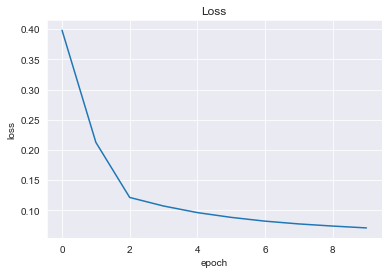

In [164]:
plt.plot(model_history.history['loss'])
plt.title('Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

<a name="5"></a>
# 5 Evaluation

Extract model predictions and evaluate its performance on scans from our validation set.

<a name="5-1"></a>
## 5.1 Overall Performance

First let's measure the overall performance on the validation set. 
- We can do this by calling the keras [evaluate_generator](https://keras.io/models/model/#evaluate_generator) function and passing in the validation generator, created in section 4.1. 

#### Using the validation set for testing
- Note: since we didn't do cross validation tuning on the final model, it's okay to use the validation set.
- For real life implementations, however, you would want to do cross validation as usual to choose hyperparamters and then use a hold out test set to assess performance

- Also note that due to the randomness in choosing sub-volumes, the values for soft dice loss and dice coefficient will be different each time that you run it.

In [186]:
val_loss, val_dice = model_3.evaluate_generator(valid_generator)

print(f"validation soft dice loss: {val_loss:.4f}")
print(f"validation dice coefficient: {val_dice:.4f}")

`Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.


validation soft dice loss: 0.1492
validation dice coefficient: 0.7975


<a name="5-2"></a>
## 5.2 Patch-level predictions

When applying the model, we'll want to look at segmentations for individual scans (entire scans, not just the sub-volumes)
- This will be a bit complicated because of our sub-volume approach. 
- First let's keep things simple and extract model predictions for sub-volumes.
- We can use the sub-volume which we extracted at the beginning of the assignment.

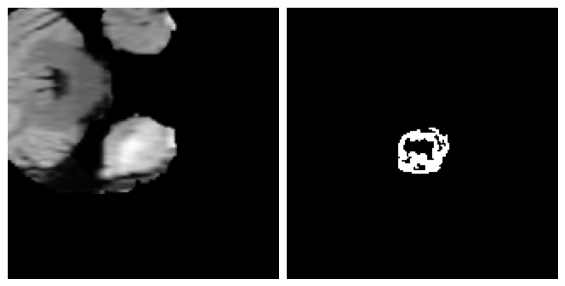

In [35]:
util.visualize_patch(X_norm[0, :, :, :], y[2])

#### Add a 'batch' dimension
We can extract predictions by calling `model.predict` on the patch. 
- We'll add an `images_per_batch` dimension, since the `predict` method is written to take in batches. 
- The dimensions of the input should be `(images_per_batch, num_channels, x_dim, y_dim, z_dim)`.

In [36]:
#adding a zero-th dimension by setting axis = 0
X_norm_with_batch_dimension = np.expand_dims(X_norm, axis=0)
patch_pred = model.predict(X_norm_with_batch_dimension)

NameError: name 'model' is not defined

In [59]:
#Each number is a model's confidence that a voxel is part of a given class 
patch_pred

array([[[[[7.29937553e-02, 3.38988118e-02, 1.94453150e-02, ...,
           6.06325269e-02, 1.05935283e-01, 1.69627473e-01],
          [2.58478764e-02, 6.56838343e-03, 2.54624430e-03, ...,
           1.31430980e-02, 2.98510119e-02, 7.83811957e-02],
          [1.50259873e-02, 3.56761087e-03, 1.32136652e-03, ...,
           9.48840566e-03, 1.97119284e-02, 5.93650416e-02],
          ...,
          [6.65584412e-06, 6.54723777e-08, 3.03647707e-09, ...,
           9.68081970e-09, 2.49295880e-07, 6.77961070e-05],
          [5.08677076e-05, 9.79847528e-07, 6.62534987e-08, ...,
           1.39885543e-07, 2.25980716e-06, 2.53934762e-04],
          [3.20305442e-03, 2.69743148e-04, 5.16077525e-05, ...,
           7.68517421e-05, 4.00316378e-04, 7.52783706e-03]],

         [[1.13413306e-02, 2.31583673e-03, 8.01042130e-04, ...,
           7.71212997e-03, 2.12089792e-02, 6.09462447e-02],
          [1.35231484e-03, 1.17917742e-04, 2.31460308e-05, ...,
           6.28947339e-04, 2.25936994e-03, 1.435815

#### Convert prediction from probability into a category
Currently, each element of `patch_pred` is a number between 0.0 and 1.0.
- Each number is the model's confidence that a voxel is part of a given class. 
- You will convert these to discrete 0 and 1 integers by using a threshold. 
- We'll use a threshold of 0.5. 
- In real applications, you would tune this to achieve your required level  of sensitivity or specificity.

In [168]:
# set threshold.
threshold = 0.5

# use threshold to get hard predictions
patch_pred[patch_pred > threshold] = 1.0
patch_pred[patch_pred <= threshold] = 0.0

Now let's visualize the original patch and ground truth alongside our thresholded predictions.

Patch and ground truth


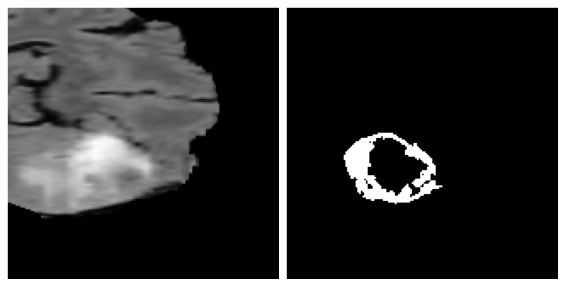

Patch and prediction


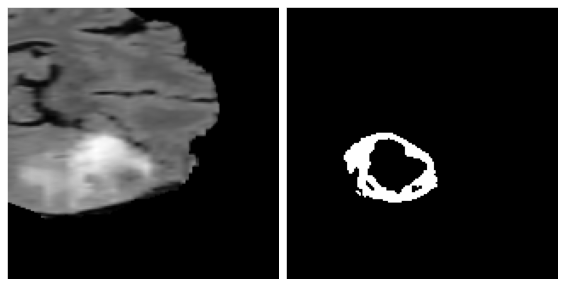

In [169]:
print("Patch and ground truth")
util.visualize_patch(X_norm[0, :, :, :], y[2])
plt.show()
print("Patch and prediction")
util.visualize_patch(X_norm[0, :, :, :], patch_pred[0, 2, :, :, :])
plt.show()

#### Sensitivity and Specificity

The model is covering some of the relevant areas, but it's definitely not perfect. 
- To quantify its performance, we can use per-pixel sensitivity and specificity. 

Recall that in terms of the true positives, true negatives, false positives, and false negatives, 

$$\text{sensitivity} = \frac{\text{true positives}}{\text{true positives} + \text{false negatives}}$$

$$\text{specificity} = \frac{\text{true negatives}}{\text{true negatives} + \text{false negatives}}$$

Below let's write a function to compute the sensitivity and specificity per output class.

In [170]:
def compute_class_sens_spec(pred, label, class_num):
    """
    Compute sensitivity and specificity for a particular example
    for a given class.

    Args:
        pred (np.array): binary arrary of predictions, shape is
                         (num classes, height, width, depth).
        label (np.array): binary array of labels, shape is
                          (num classes, height, width, depth).
        class_num (int): number between 0 - (num_classes -1) which says
                         which prediction class to compute statistics
                         for.

    Returns:
        sensitivity (float): precision for given class_num.
        specificity (float): recall for given class_num
    """

    # extract sub-array for specified class
    class_pred = pred[class_num]
    class_label = label[class_num]

    
    # compute true positives, false positives, 
    # true negatives, false negatives
    tp = np.sum((class_pred == 1) & (class_label == 1))
    tn = np.sum((class_pred == 0) & (class_label == 1))
    fp = np.sum((class_pred == 1) & (class_label == 0))
    fn = np.sum((class_pred == 0) & (class_label == 0))

    # compute sensitivity and specificity
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return sensitivity, specificity

#### Sensitivity and Specificity for the patch prediction

Next let's compute the sensitivity and specificity on that patch for expanding tumors. 

In [171]:
sensitivity, specificity = compute_class_sens_spec(patch_pred[0], y, 2)

print(f"Sensitivity: {sensitivity:.4f}")
print(f"Specificity: {specificity:.4f}")

Sensitivity: 0.0218
Specificity: 0.4731


#### Expected output:

```Python
Sensitivity: 0.0211
Specificity: 0.5867
```

We can also display the sensitivity and specificity for each class.

In [172]:
def get_sens_spec_df(pred, label):
    patch_metrics = pd.DataFrame(
        columns = ['Edema', 
                   'Non-Enhancing Tumor', 
                   'Enhancing Tumor'], 
        index = ['Sensitivity',
                 'Specificity'])
    
    for i, class_name in enumerate(patch_metrics.columns):
        sens, spec = compute_class_sens_spec(pred, label, i)
        patch_metrics.loc['Sensitivity', class_name] = round(sens,4)
        patch_metrics.loc['Specificity', class_name] = round(spec,4)

    return patch_metrics

In [173]:
df = get_sens_spec_df(patch_pred[0], y)

print(df)

              Edema Non-Enhancing Tumor Enhancing Tumor
Sensitivity  0.0382               0.024          0.0218
Specificity  0.5383              0.5259          0.4731


<a name="5-3"></a>
## 5.3 Running on entire scans
As of now, our model just runs on patches, but what we really want to see is our model's result on a whole MRI scan. 

- To do this, generate patches for the scan.
- Then we run the model on the patches. 
- Then combine the results together to get a fully labeled MR image.

The output of our model will be a 4D array with 3 probability values for each voxel in our data. 
- We then can use a threshold (which you can find by a calibration process) to decide whether or not to report a label for each voxel. 

We have written a function that stitches the patches together:  `predict_and_viz(image, label, model, threshold)` 
- Inputs: an image, label and model.
- Ouputs: the model prediction over the whole image, and a visual of the ground truth and prediction. 


- Red is edema
- Green is a non-enhancing tumor
- Blue is an enhancing tumor

### Model_1 first prediction

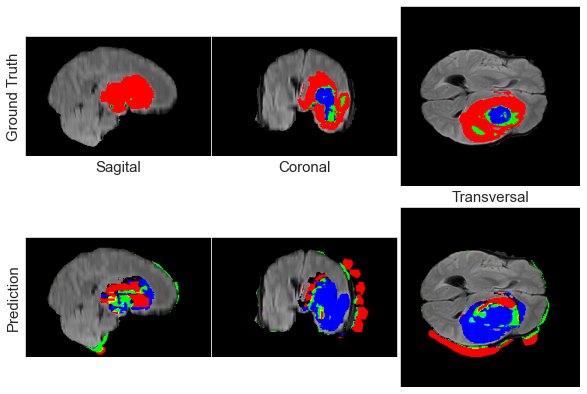

In [36]:
DATA_DIR = "Data/Train"

image, label = load_case(DATA_DIR + "/BRATS_200.nii.gz", DATA_DIR + "_labels/BRATS_200.nii.gz")
pred = util.predict_and_viz(image, label, model, .5, loc=(130, 130, 77))

### Model_2 first prediction

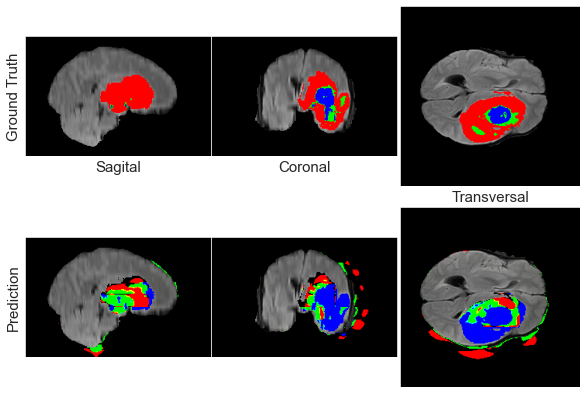

In [66]:
DATA_DIR = "Data/Train"

image, label = load_case(DATA_DIR + "/BRATS_200.nii.gz", DATA_DIR + "_labels/BRATS_200.nii.gz")
pred = util.predict_and_viz(image, label, model, .5, loc=(130, 130, 77))

### Model new lr 

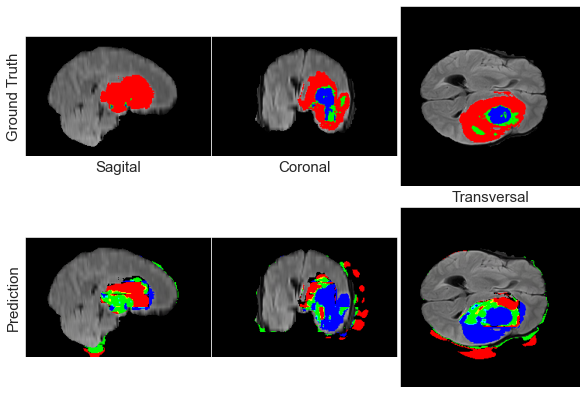

In [148]:
DATA_DIR = "Data/Train"

image, label = load_case(DATA_DIR + "/BRATS_200.nii.gz", DATA_DIR + "_labels/BRATS_200.nii.gz")
pred = util.predict_and_viz(image, label, model_2, .5, loc=(130, 130, 77))

### Andrijin model

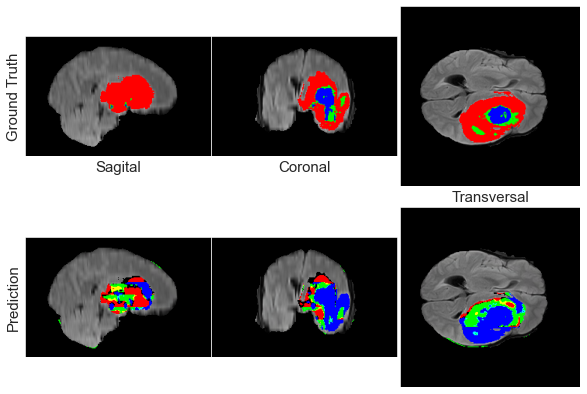

In [174]:
DATA_DIR = "Data/Train"

image, label = load_case(DATA_DIR + "/BRATS_200.nii.gz", DATA_DIR + "_labels/BRATS_200.nii.gz")
pred = util.predict_and_viz(image, label, model_3, .5, loc=(130, 130, 77))

### Model_1 second prediction

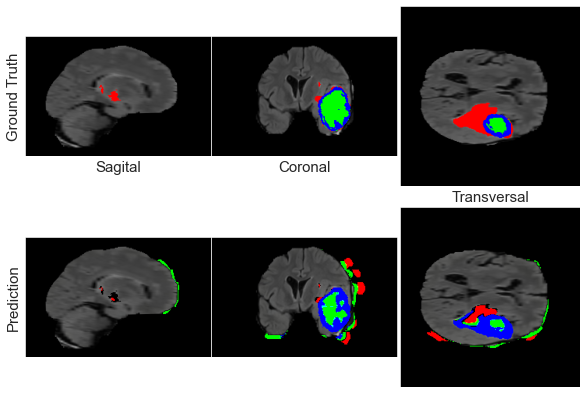

In [29]:
image, label = load_case(DATA_DIR + "/BRATS_001.nii.gz", DATA_DIR + "_labels/BRATS_001.nii.gz")
pred = util.predict_and_viz(image, label, model, .5, loc=(130, 130, 77))                

### Model_2 second prediction

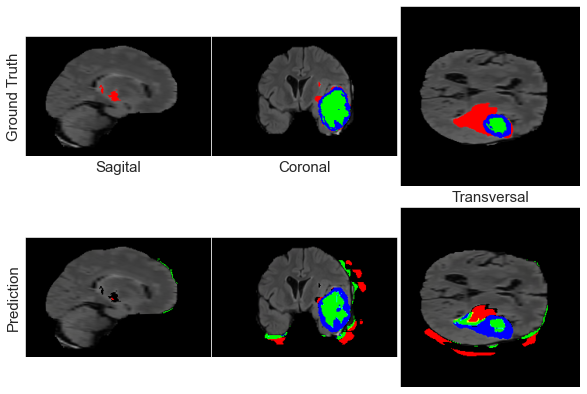

In [67]:
image, label = load_case(DATA_DIR + "/BRATS_001.nii.gz", DATA_DIR + "_labels/BRATS_001.nii.gz")
pred = util.predict_and_viz(image, label, model, .5, loc=(130, 130, 77))  

### Model new lr 

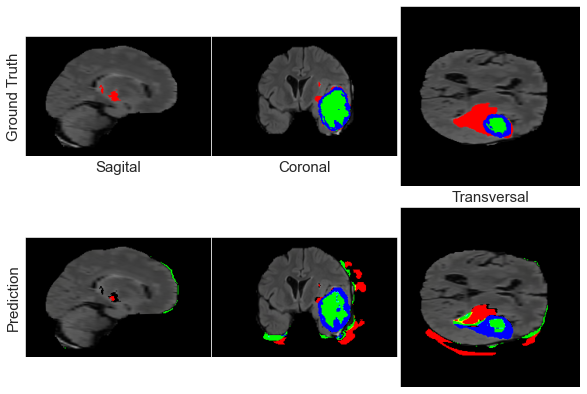

In [149]:
image, label = load_case(DATA_DIR + "/BRATS_001.nii.gz", DATA_DIR + "_labels/BRATS_001.nii.gz")
pred = util.predict_and_viz(image, label, model, .5, loc=(130, 130, 77)) 

### Andrijin model

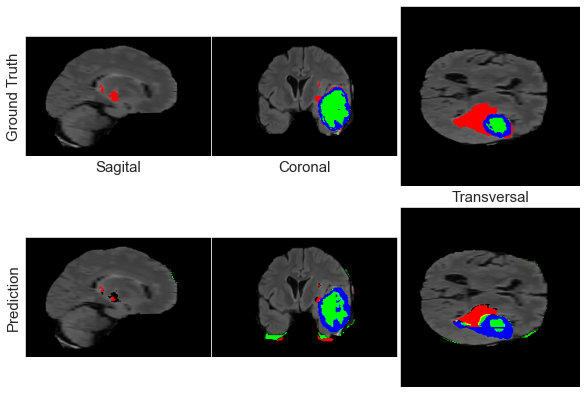

In [175]:
image, label = load_case(DATA_DIR + "/BRATS_001.nii.gz", DATA_DIR + "_labels/BRATS_001.nii.gz")
pred = util.predict_and_viz(image, label, model_3, .5, loc=(130, 130, 77)) 

### Model_1 third prediction

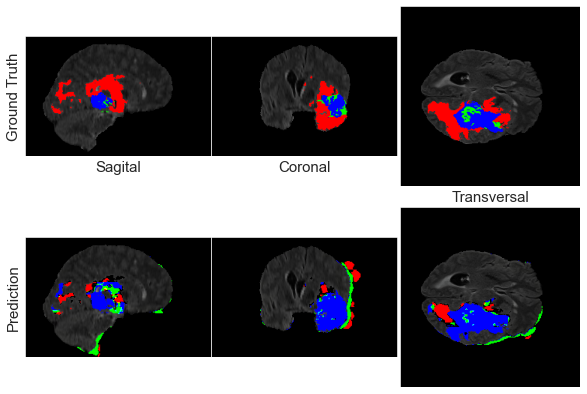

In [30]:
image, label = load_case(DATA_DIR + "/BRATS_303.nii.gz", DATA_DIR + "_labels/BRATS_303.nii.gz")
pred = util.predict_and_viz(image, label, model, .5, loc=(130, 130, 77))               

### Model_2 third prediction

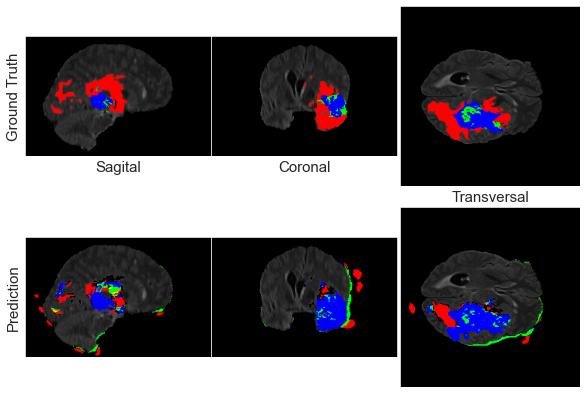

In [68]:
image, label = load_case(DATA_DIR + "/BRATS_303.nii.gz", DATA_DIR + "_labels/BRATS_303.nii.gz")
pred = util.predict_and_viz(image, label, model, .5, loc=(130, 130, 77))   

### Model new lr 

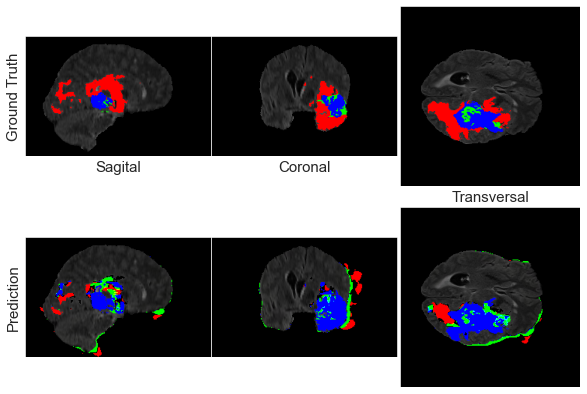

In [152]:
image, label = load_case(DATA_DIR + "/BRATS_303.nii.gz", DATA_DIR + "_labels/BRATS_303.nii.gz")
pred = util.predict_and_viz(image, label, model, .5, loc=(130, 130, 77))               

### Andrijin model

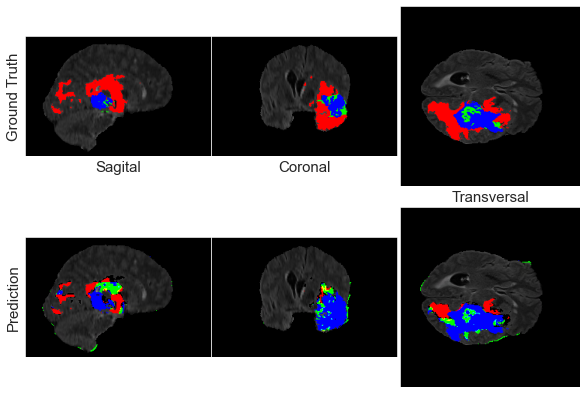

In [176]:
image, label = load_case(DATA_DIR + "/BRATS_303.nii.gz", DATA_DIR + "_labels/BRATS_303.nii.gz")
pred = util.predict_and_viz(image, label, model_3, .5, loc=(130, 130, 77))  

In [181]:
DATA_DIR = "Data/Valid"

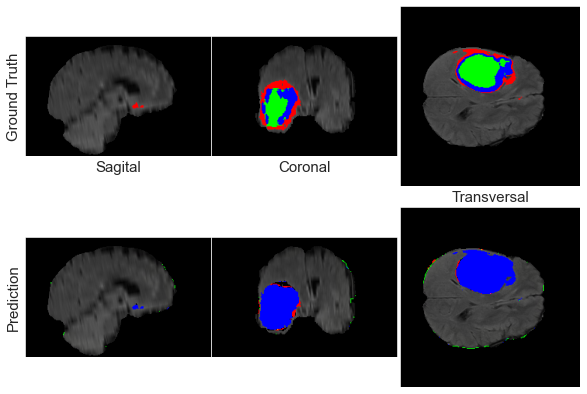

In [183]:
image, label = load_case(DATA_DIR + "/BRATS_404.nii.gz", DATA_DIR + "_labels/BRATS_404.nii.gz")
pred = util.predict_and_viz(image, label, model_3, .5, loc=(130, 130, 77))  

#### Check how well the predictions do

We can see some of the discrepancies between the model and the ground truth visually. 
- We can also use the functions we wrote previously to compute sensitivity and specificity for each class over the whole scan.
- First we need to format the label and prediction to match our functions expect.

In [184]:
whole_scan_label = keras.utils.to_categorical(label, num_classes = 4)
whole_scan_pred = pred

# move axis to match shape expected in functions
whole_scan_label = np.moveaxis(whole_scan_label, 3 ,0)[1:4]
whole_scan_pred = np.moveaxis(whole_scan_pred, 3, 0)[1:4]

Now we can compute sensitivity and specificity for each class just like before.

In [185]:
whole_scan_df = get_sens_spec_df(whole_scan_pred, whole_scan_label)

print(whole_scan_df)

              Edema Non-Enhancing Tumor Enhancing Tumor
Sensitivity  0.0011                 0.0          0.0046
Specificity  0.7942              0.7317          0.0001


### Checking distribution of class labels in training data:

In [11]:
#initializing dict where I will save how much values of each of the 3 classes are present
number_per_class = dict.fromkeys(range(4), 0)
number_per_class

{0: 0, 1: 0, 2: 0, 3: 0}

In [15]:
#y is a categorical variable and has following view: y[0] represents edema and in this array there is 0 and 1 values
#0 representing there is no edema, and 1 representing there is edema; same is for other 2 classes

#0: edema
#1: non-enhancing tumor
#2: enhancing tumor
#3: none of these

In [12]:
label_path = "BraTS-Data/processed/train_standardize/"
dirs = os.listdir(label_path)

for file in dirs:
    with h5py.File(label_path + file, 'r') as f:
        label = np.array(f.get("y")) 
        for i in range(3):
            unique, counts = np.unique(label[i], return_counts=True)
            number_per_class[3] += counts[0]
            if counts.shape == (2,):
                number_per_class[i] += counts[1]            

In [13]:
number_per_class

{0: 193116494, 1: 65990448, 2: 63389994, 3: 13943871064}

In [14]:
total = 193116494 + 65990448 + 63389994 + 13943871064
total

14266368000

In [15]:
#checking if my results are okay
11610*3*160*160*16

14266368000

In [16]:
#0:edema
y_edema = number_per_class[0]/total
print("Percentage of edema in labels of patches is {:.2%}".format(y_edema))

#1:non-enhancing tumor
y_non_enhancing = number_per_class[1]/total
print("Percentage of non-enhancing tumors in labels of patches is {:.2%}".format(y_non_enhancing))

#2:enhancing tumor
y_enhancing = number_per_class[2]/total
print("Percentage of enhancing tumors in labels of patches is {:.2%}".format(y_enhancing))

Percentage of edema in labels of patches is 1.35%
Percentage of non-enhancing tumors in labels of patches is 0.46%
Percentage of enhancing tumors in labels of patches is 0.44%


### Visualize number of classes present in the training data

### Just for the laughs, let's plot it with the background class too

<BarContainer object of 4 artists>

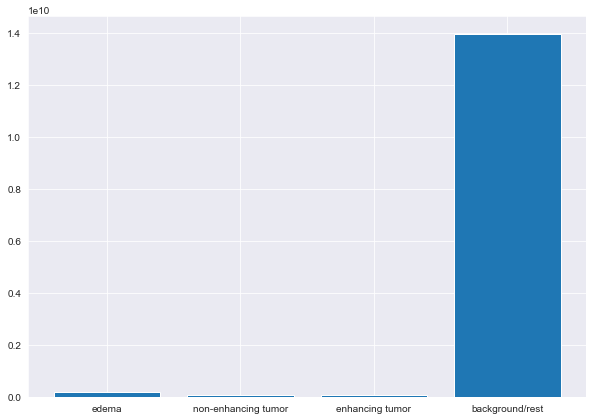

In [31]:
values = [193116494, 65990448, 63389994, 13943871064]
name = ['edema', 'non-enhancing tumor', 'enhancing tumor', 'background/rest']
 
# Figure Size
fig = plt.figure(figsize =(10, 7))
 
# Horizontal Bar Plot
plt.bar(name, values)
 
# Show Plot
plt.show()

### OK now a bit more useful plot, only 3 classes our model is predicting:

<BarContainer object of 3 artists>

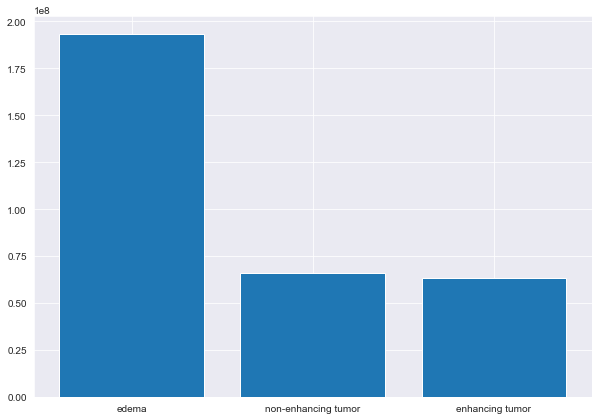

In [32]:
values = [193116494, 65990448, 63389994]
name = ['edema', 'non-enhancing tumor', 'enhancing tumor']
 
# Figure Size
fig = plt.figure(figsize =(10, 7))
 
# Horizontal Bar Plot
plt.bar(name, values)
 
# Show Plot
plt.show()

In [ ]:
"""json_file = open('model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights("model.h5")
print("Loaded model from disk")"""